Import the necessary modules and packages

In [4]:
import os
os.chdir('..')

In [1]:
import os
import pandas as pd
from textflow.Test import Test
from textflow.Visualization import Visualization

In [2]:
df = pd.read_csv('c:\\Users\\UJA\\Desktop\\textflow\\Examples\\df_trans_merged_textflow.csv')
df = df.drop(['Unnamed: 0'],axis=1)

In [3]:
df

,id_PRECOM,Sexo,Edad,Criterio,text,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,...,lexicalDiversitySimpleTTR,lexicalDiversityRootTTR,lexicalDiversityLogTTR,lexicalDiversityMaasTTR,lexicalDiversityMSTTR,lexicalDiversityMATTR,lexicalDiversityHDD,lexicalDiversityMTLD,lexicalDiversityMTLDMAWrap,lexicalDiversityMTLDMABi
0,CO_5,Chico,13,Selectiva,No. La primera vez que gané... pues me sentí b...,210,132,1159,6,64,...,0.318352,5.201916,0.795141,0.084425,0.572000,0.571560,0.646932,25.919298,23.172285,22.020526
1,CO_11,Chica,16,Sana,Me desconecto un poco de lo que es... el estré...,409,196,2101,5,108,...,0.269547,5.942281,0.788075,0.078881,0.662222,0.641922,0.708650,32.587322,32.934156,32.901511
2,CHF_8,Chica,14,Selectiva,Pues diversión a veces también y también a vec...,141,88,743,5,40,...,0.388235,5.061969,0.815775,0.082596,0.620000,0.640496,0.653793,26.511682,26.841176,26.991648
3,CHF_7,Chico,15,Selectiva,Le explicaría que es como una realidad virtual...,598,261,3045,5,169,...,0.274336,7.143287,0.801600,0.070076,0.658462,0.654340,0.711610,31.927581,33.143068,32.918554
4,CHF_14,Chica,14,Selectiva,"Porque es como... No sé, o sea, no le veo impo...",286,149,1500,5,76,...,0.298507,5.463584,0.792065,0.082349,0.683333,0.676573,0.699070,39.990750,36.262687,36.898698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,JA_26,Chico,13,Clínica,Sí. Al Fortnite. Me gusta mucho jugar. Y hablo...,120,85,612,5,38,...,0.394737,4.866643,0.814976,0.084801,0.593333,0.588350,0.625466,23.523810,22.243421,21.470985
140,JA_25,Chica,14,Clínica,"Pues la verdad porque no está en persona, no c...",1087,358,5479,5,190,...,0.151062,5.385530,0.735565,0.085188,0.621600,0.621718,0.696784,29.910022,28.863100,29.083484
141,HA_1,Chico,12,Clínica,"Emoción. No, simplemente pues... digo, bueno, ...",367,198,1996,5,96,...,0.270563,5.815526,0.786939,0.079959,0.660000,0.662567,0.690977,33.551131,32.443723,32.965857
142,CZ_3,Chico,15,Clínica,"No sé... Yo creo que a mí pues no sé, no me di...",325,174,1606,5,79,...,0.267176,5.296549,0.779061,0.085160,0.637143,0.634826,0.680475,29.826615,29.913486,30.169811


In [3]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\UJA\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [4]:
from textflow.POSAnalyzer import POSAnalyzer
from textflow.NGramsAnalyzer import NGramsAnalyzer
from textflow.SequenceString import SequenceString

listSequence = []
for index, row in df.iterrows(): 
  s = SequenceString(row["text"])
  listSequence.append(s)
  
#Creamos los analizadores
pos = POSAnalyzer()
n1 = NGramsAnalyzer(tokenizer=RegexpTokenizer(r"[\w']+"),ngramsSize = 1)
n2 = NGramsAnalyzer(tokenizer=RegexpTokenizer(r"[\w']+"),ngramsSize = 2,stopwords=[])
n3 = NGramsAnalyzer(tokenizer=RegexpTokenizer(r"[\w']+"),ngramsSize = 3,stopwords=[])
n4 = NGramsAnalyzer(tokenizer=RegexpTokenizer(r"[\w']+"),ngramsSize = 4,stopwords=[])

for s in listSequence:
  pos.analyze(s,"POS","text")
  n1.analyze(s,"1-grams","text")
  n2.analyze(s,"2-grams","text")
  n3.analyze(s,"3-grams","text")
  n4.analyze(s,"4-grams","text")

labels = ["POS","1-grams","2-grams","3-grams","4-grams"]

dicTotal = {}

for seq in listSequence:
  for l in seq.metadata:
    if l in labels:
      for key in seq.metadata[l][0]:
        l_key = str(l+key)
        dicTotal[l_key] = dicTotal.get(l_key, []) + [seq.metadata[l][0][key]]

for k in dicTotal:
  df[str(k)] = dicTotal[k]

df

✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')


c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


,id_PRECOM,Sexo,Edad,Criterio,text,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,...,POSRelFreqPOS,POSPOSTokens,1-gramsn-grams,1-gramsfreqN-Grams,2-gramsn-grams,2-gramsfreqN-Grams,3-gramsn-grams,3-gramsfreqN-Grams,4-gramsn-grams,4-gramsfreqN-Grams
0,CO_5,Chico,13,Selectiva,No. La primera vez que gané... pues me sentí b...,210,132,1159,6,64,...,"{'ADV': 0.10112359550561797, 'PUNCT': 0.213483...","{'ADV': {'No': 5, 'bien': 1, 'ya': 2, 'mismo':...","[así, bien, bueno, básicamente, casi, cosa, co...","{'primera': 1, 'vez': 2, 'gané': 1, 'pues': 10...","[a decir, a veces, así que, bien y, bueno a, b...","{'no la': 1, 'la primera': 1, 'primera vez': 1...","[a decir como, a veces siento, a veces sí, así...","{'no la primera': 1, 'la primera vez': 1, 'pri...","[a decir como la, a veces siento frustración, ...","{'no la primera vez': 1, 'la primera vez que':..."
1,CO_11,Chica,16,Sana,Me desconecto un poco de lo que es... el estré...,409,196,2101,5,108,...,"{'PRON': 0.09465020576131687, 'VERB': 0.137860...","{'PRON': {'Me': 2, 'lo': 11, 'que': 5, 'me': 8...","[14, amigos, aplicación, aprender, así, aunque...","{'desconecto': 1, 'estrés': 1, 'día': 2, 'divi...","[14 o, a día, a jugar, a lo, a los, a una, ami...","{'me desconecto': 1, 'desconecto un': 1, 'un p...","[14 o así, a día y, a jugar un, a lo típico, a...","{'me desconecto un': 1, 'desconecto un poco': ...","[14 o así no, a día y me, a jugar un rato, a l...","{'me desconecto un poco': 1, 'desconecto un po..."
2,CHF_8,Chica,14,Selectiva,Pues diversión a veces también y también a vec...,141,88,743,5,40,...,"{'SCONJ': 0.11176470588235295, 'VERB': 0.15882...","{'SCONJ': {'Pues': 4, 'que': 8, 'cuando': 2, '...","[aburro, amigos, bien, cosa, decepción, divers...","{'pues': 5, 'diversión': 2, 'veces': 4, 'juego...","[a intentar, a lo, a veces, a videojuegos, abu...","{'pues diversión': 2, 'diversión a': 1, 'a vec...","[a intentar hasta, a lo mejor, a veces que, a ...","{'pues diversión a': 1, 'diversión a veces': 1...","[a intentar hasta que, a lo mejor me, a veces ...","{'pues diversión a veces': 1, 'diversión a vec..."
3,CHF_7,Chico,15,Selectiva,Le explicaría que es como una realidad virtual...,598,261,3045,5,169,...,"{'PRON': 0.09734513274336283, 'VERB': 0.128318...","{'PRON': {'Le': 1, 'que': 16, 'se': 3, 'yo': 4...","[8, 9, acaba, acción, acostumbrado, acostumbra...","{'explicaría': 1, 'realidad': 1, 'virtual': 1,...","[8 9, 9 años, a acostumbrarse, a cualquier, a ...","{'le explicaría': 1, 'explicaría que': 1, 'que...","[8 9 años, 9 años dentro, a acostumbrarse y, a...","{'le explicaría que': 1, 'explicaría que es': ...","[8 9 años dentro, 9 años dentro del, a acostum...","{'le explicaría que es': 1, 'explicaría que es..."
4,CHF_14,Chica,14,Selectiva,"Porque es como... No sé, o sea, no le veo impo...",286,149,1500,5,76,...,"{'SCONJ': 0.11940298507462686, 'AUX': 0.050746...","{'SCONJ': {'Porque': 4, 'como': 10, 'pues': 3,...","[aburrida, adolescentes, ahora, alegre, así, b...","{'sé': 1, 'veo': 4, 'importancia': 3, 'hago': ...","[a jugar, a temprana, a veces, aburrida osea, ...","{'porque es': 2, 'es como': 4, 'como no': 1, '...","[a jugar videojuegos, a temprana edad, a veces...","{'porque es como': 2, 'es como no': 1, 'como n...","[a jugar videojuegos estaba, a temprana edad p...","{'porque es como no': 1, 'es como no sé': 1, '..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,JA_26,Chico,13,Clínica,Sí. Al Fortnite. Me gusta mucho jugar. Y hablo...,120,85,612,5,38,...,"{'ADV': 0.11842105263157894, 'PUNCT': 0.210526...","{'ADV': {'Sí': 1, 'mucho': 3, 'no': 4, 'antes'...","[aburro, ahora, aquí, bien, casa, empezaron, f...","{'fortnite': 1, 'gusta': 2, 'jugar': 3, 'hablo...","[a casa, a gustar, a jugar, aburro pero, ahora...","{'sí al': 1, 'al fortnite': 1, 'fortnite me': ...","[a casa de, a gustar y, a jugar y, aburro pero...","{'sí al fortnite': 1, 'al fortnite me': 1, 'fo...","[a casa de

---------------------------------------NORMALITY TEST---------------------------------------
Columnas 93
Pass the test of Shapiro
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_PRON', 'RelFreqPOS_VERB', 'RelFreqPOS_PUNCT', 'RelFreqPOS_NOUN', 'RelFreqPOS_AUX', 'complexitySSR', 'complexitypolini', 'complexitymu', 'lexicalDiversitySimpleTTR', 'lexicalDiversityRootTTR', 'lexicalDiversityLogTTR', 'lexicalDiversityMTLD', 'lexicalDiversityMTLDMAWrap', 'lexicalDiversityMTLDMABi']
Pass the test of D'Agostino
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_VERB', 'RelFreqPOS_PUNCT', 'RelFreqPOS_NOUN', 'RelFreqPOS_AUX', 'complexitymu', 'lexicalDiversitySimpleTTR', 'lexicalDiversityRootTTR', 'lexicalDiversityLogTTR', 'lexicalDiversityMTLD', 'lexicalDiversityMTLDMAWrap', 'lexicalDiversityMTLDMABi']
Pass the test of Anderson-Darling
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_AD

C:\Users\UJA\Desktop\textflow-GitHub\textflow\textflow\Test.py:318: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfResult = dfResult._append(pd.Series(row,index=dfResult.columns), ignore_index = True)


,Feature,Criteria_1,Criteria_2,Students t-test stat,Students t-test p-value,Paired Students t-Test stat,Paired Students t-Test p-value,ANOVA stat,ANOVA p-value
0,stylometryTTR,Hombre,Mujer,2733.5,0.330296,1.818304,0.074273,1.054920,0.306123
1,polarityNEG,Hombre,Mujer,1648.0,0.000573,-3.607466,0.000652,13.121334,0.000406
2,lexicalDiversityMATTR,Hombre,Mujer,2818.0,0.187603,0.809495,0.421597,1.894137,0.170903
3,stylometrySomers,Hombre,Mujer,2650.0,0.526477,0.266833,0.790561,0.164067,0.686049
4,emotionssurprise,Hombre,Mujer,1736.0,0.002032,-1.946498,0.056530,2.549359,0.112562
...,...,...,...,...,...,...,...,...,...
56,lexicalDiversityMTLD,Hombre,Mujer,2853.0,0.144216,0.565912,0.573675,1.245096,0.266376
57,volumetryavgWordsLen,Hombre,Mujer,2670.0,0.189099,1.626140,0.109437,1.743480,0.188823
58,polarityNEU,Hombre,Mujer,2698.0,0.407155,0.919124,0.361904,1.487139,0.224683
59,emotionsanger,Hombre,Mujer,1853.0,0.009083,-0.758693,0.451162,1.222372,0.270765


{'Students t-test': {'Reject H0': ['polarityNEG', 'emotionssurprise', 'ironityI', 'lexicalDiversityMaasTTR', 'emotionsfear', 'complexitymin_depth', 'polarityPOS', 'ironityNI', 'emotionsdisgust', 'emotionsanger'], 'Fail to Reject H0': ['stylometryTTR', 'lexicalDiversityMATTR', 'stylometrySomers', 'complexitymax_depth', 'RelFreqPOS_NOUN', 'complexitySSR', 'lexicalDiversityMTLDMABi', 'complexityLDI', 'complexitycrawford', 'Edad', 'emotionsjoy', 'complexityminage', 'complexityhuerta', 'complexitySOL', 'complexityILFW', 'stylometryMass', 'RelFreqPOS_PUNCT', 'lexicalDiversityMTLDMAWrap', 'RelFreqPOS_DET', 'stylometryHerdan', 'lexicalDiversityMSTTR', 'lexicalDiversitySimpleTTR', 'lexicalDiversityRootTTR', 'emotionssadness', 'RelFreqPOS_VERB', 'RelFreqPOS_ADV', 'lexicalDiversityHDD', 'RelFreqPOS_PART', 'RelFreqPOS_ADP', 'stylometryRTTR', 'complexitymean_depth', 'complexityLC', 'emotionsothers', 'RelFreqPOS_SCONJ', 'RelFreqPOS_NUM', 'RelFreqPOS_INTJ', 'RelFreqPOS_ADJ', 'complexitymu', 'complexi

C:\Users\UJA\Desktop\textflow-GitHub\textflow\textflow\Test.py:262: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfResult = dfResult._append(pd.Series(row,index=dfResult.columns), ignore_index = True)
c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\scipy\stats\_morestats.py:4102: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


['stylometryRTTR', 'Hombre', 'Mujer', 2658.0, 0.5054239140767449, 815.0, 0.7538513745631978, 0.44624616320550103, 0.5041230033173326]
                 Feature Criteria_1 Criteria_2  mannwhitneyu stat  \
0                   Edad     Hombre      Mujer             2659.0   
1         volumetrywords     Hombre      Mujer             2484.5   
2   volumetryuniqueWords     Hombre      Mujer             2578.0   
3         volumetrychars     Hombre      Mujer             2524.5   
4   volumetryavgWordsLen     Hombre      Mujer             2670.0   
5  stylometryuniqueWords     Hombre      Mujer             2559.0   
6          stylometryTTR     Hombre      Mujer             2733.5   

   mannwhitneyu p-value  wilcoxon stat  wilcoxon p-value  kruskal stat  \
0              0.494489          471.5          0.598684      0.469585   
1              0.970756          852.0          0.978381      0.001497   
2              0.733762          821.5          0.792361      0.117075   
3              0.

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\scipy\stats\_morestats.py:4102: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


['RelFreqPOS_ADJ', 'Hombre', 'Mujer', 2584.0, 0.7154412220061817, 652.0, 0.11512543811296225, 0.13439177518776776, 0.7139212592903897]
                  Feature Criteria_1 Criteria_2  mannwhitneyu stat  \
0                    Edad     Hombre      Mujer             2659.0   
1          volumetrywords     Hombre      Mujer             2484.5   
2    volumetryuniqueWords     Hombre      Mujer             2578.0   
3          volumetrychars     Hombre      Mujer             2524.5   
4    volumetryavgWordsLen     Hombre      Mujer             2670.0   
5   stylometryuniqueWords     Hombre      Mujer             2559.0   
6           stylometryTTR     Hombre      Mujer             2733.5   
7          stylometryRTTR     Hombre      Mujer             2658.0   
8        stylometryHerdan     Hombre      Mujer             2715.0   
9          stylometryMass     Hombre      Mujer             2302.0   
10       stylometrySomers     Hombre      Mujer             2650.0   
11       stylometryDugast

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\scipy\stats\_morestats.py:4102: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


['complexitynChar', 'Hombre', 'Mujer', 2259.0, 0.33354952410538263]
['complexitynChar', 'Hombre', 'Mujer', 2259.0, 0.33354952410538263, 657.5, 0.6061933126391088, 0.9390595060331695, 0.3325198300541049]
                       Feature Criteria_1 Criteria_2  mannwhitneyu stat  \
0                         Edad     Hombre      Mujer             2659.0   
1               volumetrywords     Hombre      Mujer             2484.5   
2         volumetryuniqueWords     Hombre      Mujer             2578.0   
3               volumetrychars     Hombre      Mujer             2524.5   
4         volumetryavgWordsLen     Hombre      Mujer             2670.0   
..                         ...        ...        ...                ...   
59    complexityavglenSentence     Hombre      Mujer             2547.0   
60  complexitynPuntuationMarks     Hombre      Mujer             2522.5   
61            complexitynWords     Hombre      Mujer             2484.5   
62        complexitynRareWords     Hombre      

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\scipy\stats\_morestats.py:4102: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


,Feature,Criteria_1,Criteria_2,mannwhitneyu stat,mannwhitneyu p-value,wilcoxon stat,wilcoxon p-value,kruskal stat,kruskal p-value
0,Edad,Hombre,Mujer,2659.0,0.494489,471.5,0.598684,0.469585,0.493178
1,volumetrywords,Hombre,Mujer,2484.5,0.970756,852.0,0.978381,0.001497,0.969132
2,volumetryuniqueWords,Hombre,Mujer,2578.0,0.733762,821.5,0.792361,0.117075,0.732228
3,volumetrychars,Hombre,Mujer,2524.5,0.902742,840.0,0.904478,0.015434,0.901129
4,volumetryavgWordsLen,Hombre,Mujer,2670.0,0.189099,30.0,0.108809,1.734463,0.187842
...,...,...,...,...,...,...,...,...,...
88,lexicalDiversityMATTR,Hombre,Mujer,2818.0,0.187603,798.0,0.656186,1.741714,0.186922
89,lexicalDiversityHDD,Hombre,Mujer,2795.0,0.220945,808.0,0.713051,1.503210,0.220178
90,lexicalDiversityMTLD,Hombre,Mujer,2853.0,0.144216,842.0,0.916755,2.138335,0.143658
91,lexicalDiversityMTLDMAWrap,Hombre,Mujer,2793.0,0.224034,848.0,0.953695,1.483301,0.223259


{'mannwhitneyu': {'Reject H0': ['polarityNEG', 'polarityPOS', 'emotionsanger', 'emotionssurprise', 'emotionsdisgust', 'emotionsfear', 'complexitymin_depth', 'ironityNI', 'ironityI', 'lexicalDiversityMaasTTR'], 'Fail to Reject H0': ['Edad', 'volumetrywords', 'volumetryuniqueWords', 'volumetrychars', 'volumetryavgWordsLen', 'stylometryuniqueWords', 'stylometryTTR', 'stylometryRTTR', 'stylometryHerdan', 'stylometryMass', 'stylometrySomers', 'stylometryDugast', 'stylometryHonore', 'FreqPOS_ADP', 'FreqPOS_SCONJ', 'FreqPOS_DET', 'FreqPOS_PRON', 'FreqPOS_CCONJ', 'FreqPOS_VERB', 'FreqPOS_NUM', 'FreqPOS_PART', 'FreqPOS_PUNCT', 'FreqPOS_SPACE', 'FreqPOS_ADJ', 'FreqPOS_INTJ', 'FreqPOS_ADV', 'FreqPOS_NOUN', 'FreqPOS_AUX', 'FreqPOS_PROPN', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_PRON', 'RelFreqPOS_CCONJ', 'RelFreqPOS_VERB', 'RelFreqPOS_NUM', 'RelFreqPOS_PART', 'RelFreqPOS_PUNCT', 'RelFreqPOS_SPACE', 'RelFreqPOS_ADJ', 'RelFreqPOS_INTJ', 'RelFreqPOS_ADV', 'RelFreqPOS_NOUN'

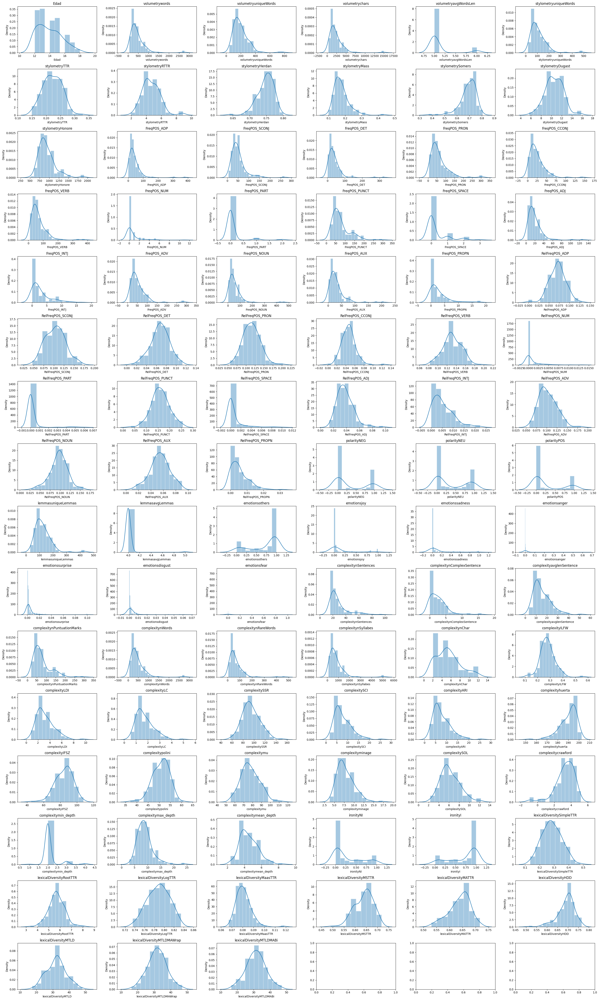

---------------------------------------PROBPLOT GRAPHICS---------------------------------------


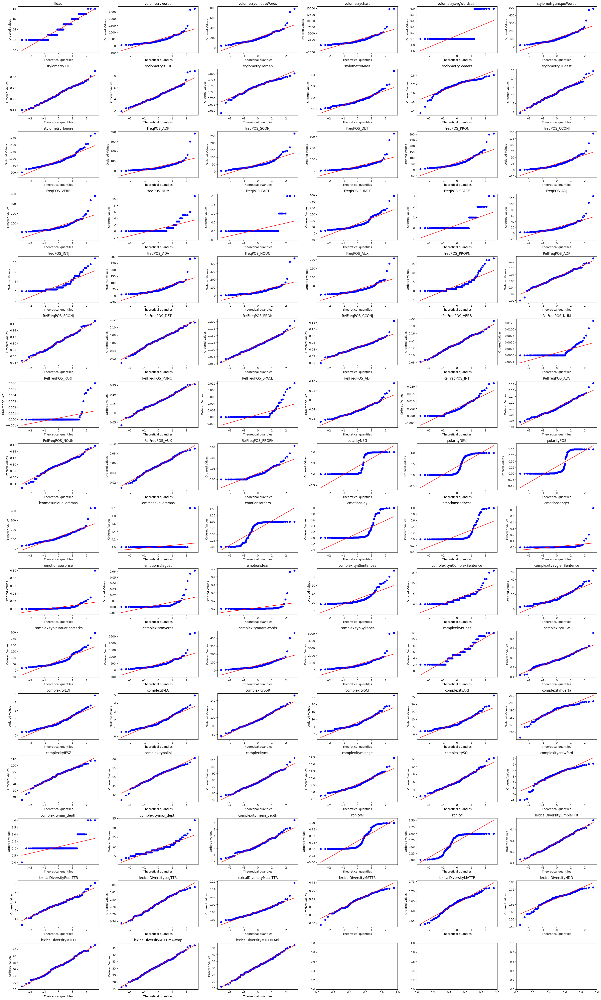

---------------------------------------KDE GRAPHICS---------------------------------------


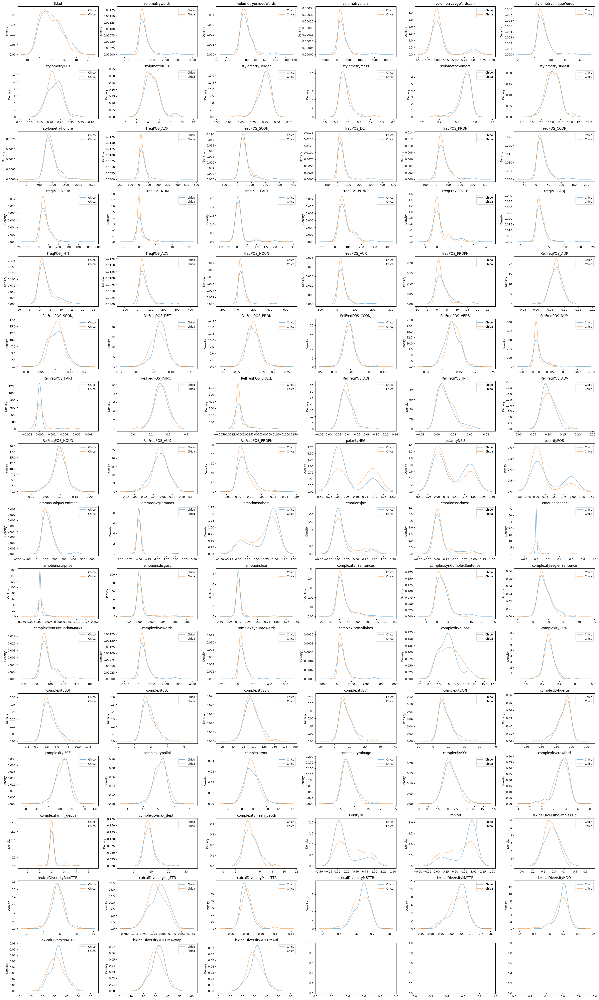

---------------------------------------BOXPLOT GRAPHICS---------------------------------------


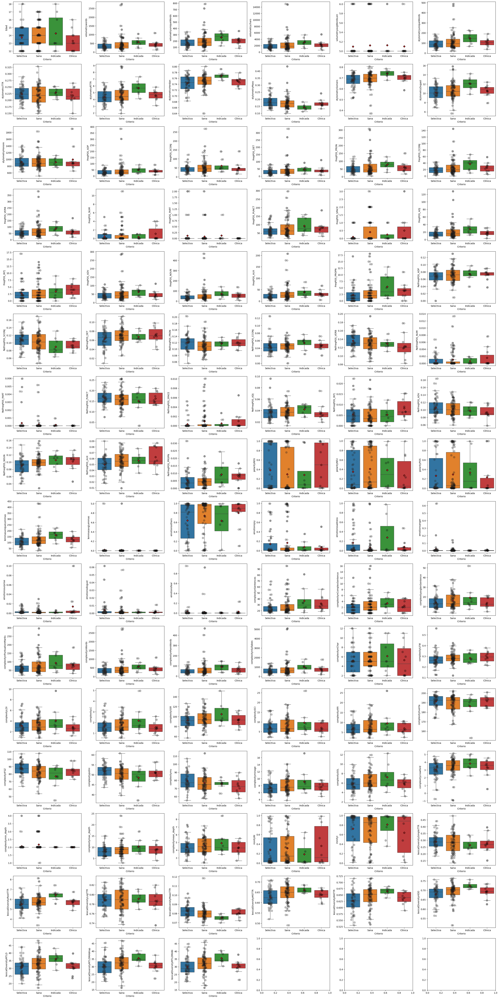

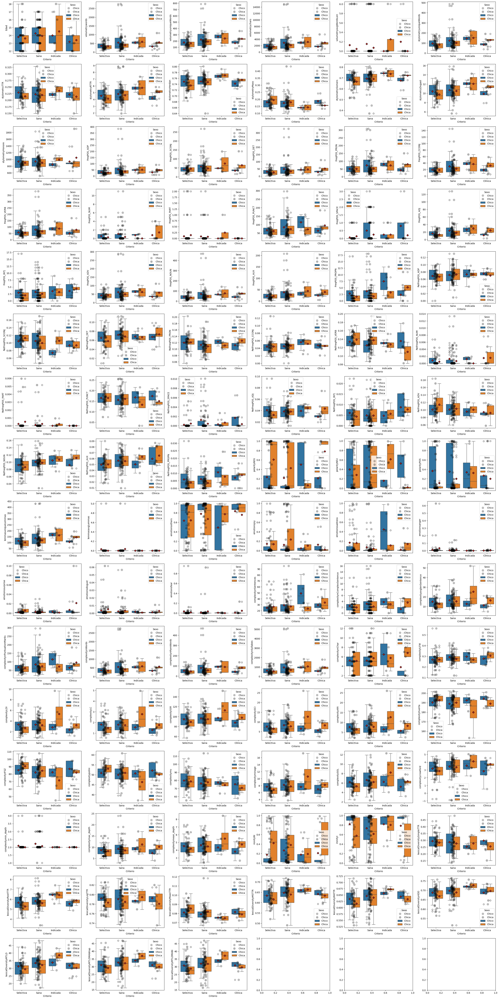

In [4]:
t=Test()
numeric_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype != 'object']
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
testResults=t.report(df[df['Sexo']=="Chico"],df[df['Sexo']=="Chica"],"Hombre","Mujer",visualizer,'Sexo',['Criterio','Criterio'],[None,'Sexo'])

In [8]:
categories = {'Criterio': ['Selectiva', 'Sana', 'Indicada', 'Clínica'],
            'Sexo': ['Chico', 'Chica'],
            'Edad': ['13', '16', '14', '15', '17', '12', '18']}

import unicodedata
def remove_control_characters(s):
    return "".join(ch for ch in s if unicodedata.category(ch)[0]!="C")

min_freq = 10

pos_tags = set()
for l in df['POSsrcPOSTag'][:2]:
  for token, pos in l:
    pos_tags.add(pos)

pos_dic = {'Chico': {}, 'Chica': {}}
for sexo in categories['Sexo']:
  for pos in pos_tags:
    pos_dic[sexo][pos] = pos_dic[sexo].get(pos, {})
    for criterio in categories['Criterio']:
      pos_dic[sexo][pos][criterio] = pos_dic[sexo][pos].get(criterio, {})
      token_freq = {}
      count = 0
      for l in df[(df['Criterio'] == criterio) & (df['Sexo'] == sexo)]['POSsrcPOSTag']:
        count += 1
        for token, pos_l in l:
          if pos == pos_l:
            token_freq[pos] = token_freq.get(pos, {})
            token_freq[pos][token] = token_freq[pos].get(token, 0) + 1
      if token_freq:
        relevant_pos = map(lambda x: (x[0], x[1]/count), token_freq[pos].items())
        relevant_pos = filter(lambda x: x[1] > 0.5, relevant_pos)
        relevant_pos = sorted(relevant_pos, key=lambda x: x[1], reverse=True)[:100]
        pos_dic[sexo][pos][criterio] = set(map(lambda x: remove_control_characters(x[0]), relevant_pos))

table = {'sexo': [], 'pos': [], 'criterio_A': [], 'criterio_B': [],
         'common_terms': [], 'diff_A-B': [], 'diff_B-A': [], 'terms_A': [], 'terms_B': []}

for sexo in categories['Sexo']:
  for pos in pos_tags:
    pos_dic[sexo][pos] = pos_dic[sexo].get(pos, {})
    for cri_i in range(len(categories['Criterio'])):
      criA = categories['Criterio'][cri_i]
      for cri_j in range(cri_i+1, len(categories['Criterio'])):
        criB = categories['Criterio'][cri_j]
        table['sexo'].append(sexo)
        table['pos'].append(pos)
        table['criterio_A'].append(criA)
        table['criterio_B'].append(criB)
        setA = pos_dic[sexo][pos][criA]
        setB = pos_dic[sexo][pos][criB]
        if pos == 'NUM':
          setA = set(setA)
          setB = set(setB)
        table['common_terms'].append(', '.join(list(setA.intersection(setB))))
        table['diff_A-B'].append(', '.join(list(setA.difference(setB))))
        table['diff_B-A'].append(', '.join(list(setB.difference(setA))))
        table['terms_A'].append(', '.join(list(setA)))
        table['terms_B'].append(', '.join(list(setB)))

pd.DataFrame(table).to_csv('tokens_by_pos.csv')

# N-Grams

<Figure size 640x480 with 0 Axes>

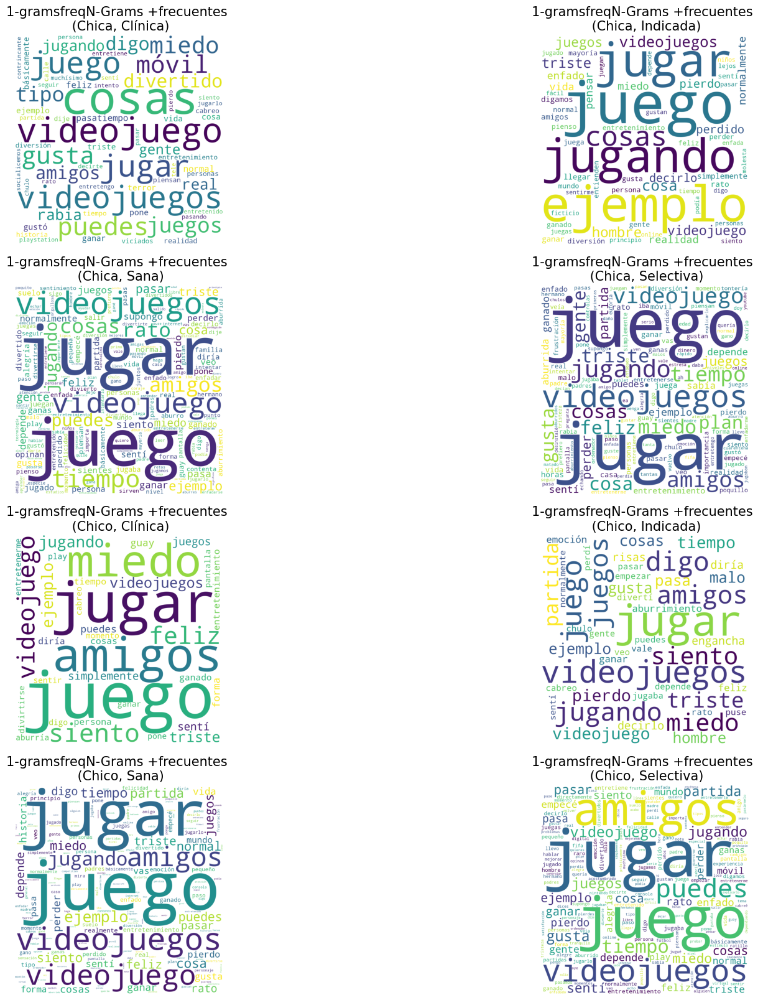

In [8]:
from spacy.lang.es.stop_words import STOP_WORDS
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
new_df = pd.DataFrame()
for ngramas in [str(n+1)+"-gramsfreqN-Grams" for n in range(4)]:
    newdf = df.groupby(['Sexo', 'Criterio'])[ngramas].agg(lambda x: dict(sorted({k: sum(d.get(k, 0) for d in x) for k in set().union(*x)}.items(), key=lambda item:item[1], reverse=True))).reset_index()
    ngramsArray=[]
    for i in newdf.index:
        ngramsDict= newdf[ngramas][i].copy()
        for k in newdf[ngramas][i]:
            valid = False
            for e in k.split(' '):
                if e not in STOP_WORDS and len(e) > 1:
                    valid = True
                    break
            if not valid or  ngramsDict[k] < 3: 
                del ngramsDict[k]
        ngramsArray.append(ngramsDict)
    new_df[ngramas], new_df['Sexo'], new_df['Criterio'] = ngramsArray, newdf['Sexo'], newdf['Criterio']
#visualizer.show_wordCloud(new_df,[str(n+1)+"-gramsfreqN-Grams" for n in range(4)], hspace= 0,titleGraphicSize= 4,groupby=['Sexo','Criterio'])
visualizer.show_wordCloud(new_df,["1-gramsfreqN-Grams"], widthGraphic = 20,heightGraphic=20,hspace= 0.25,titleGraphicSize= 15,groupby=['Sexo','Criterio'])


# POS

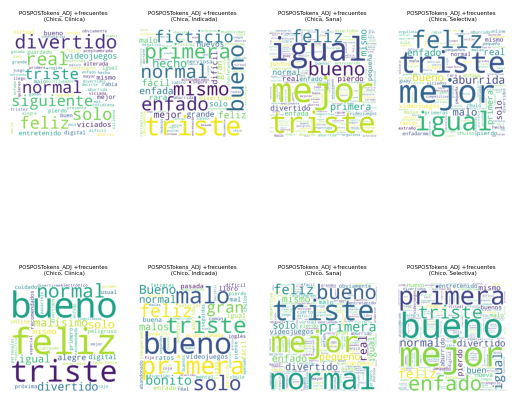

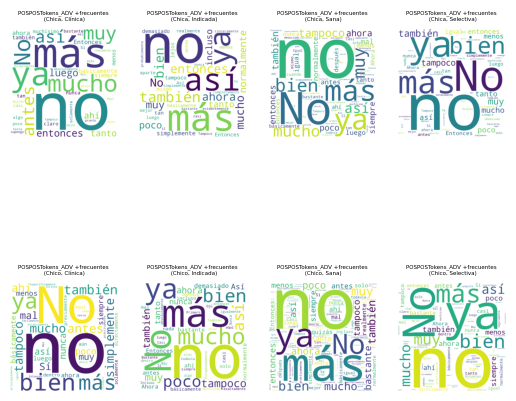

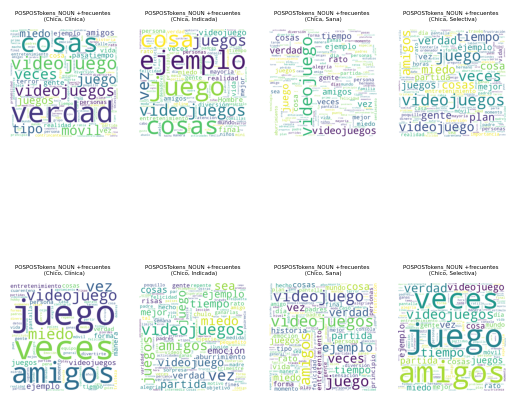

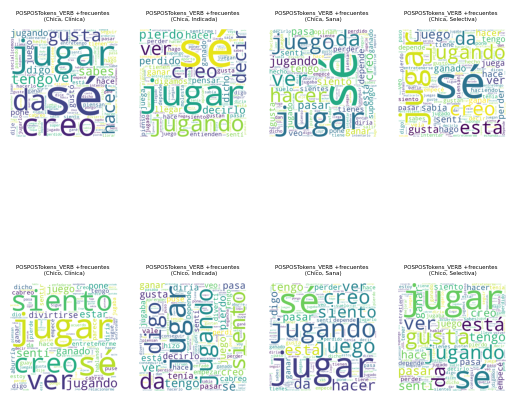

In [13]:

POS_LIST = ["ADJ", "ADV", "NOUN", "VERB"]
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
new_df = pd.DataFrame()
first=True
for pos in POS_LIST:
    df['POSPOSTokens'+"_"+pos] = [df['POSPOSTokens'][i].get(pos, {}) for i in df.index]
    newdf = df.groupby(['Sexo', 'Criterio'])['POSPOSTokens_'+pos].agg(lambda x: dict(sorted({k: sum(d.get(k, 0) for d in x) for k in set().union(*x)}.items(), key=lambda item:item[1], reverse=True))).reset_index()
    newdf = newdf.drop(['Sexo', 'Criterio'], axis=1) if first==False else newdf
    first = False
    new_df = pd.concat([new_df, newdf], axis=1)
visualizer.show_wordCloud(new_df,['POSPOSTokens'+"_"+pos for pos in POS_LIST], hspace= 1.2,titleGraphicSize= 4,groupby=['Sexo','Criterio'])


# Inference

In [6]:
from textflow.Inference import Inference

inference = Inference()

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


ImportError: 
AutoModel requires the PyTorch library but it was not found in your environment. Checkout the instructions on the
installation page: https://pytorch.org/get-started/locally/ and follow the ones that match your environment.
Please note that you may need to restart your runtime after installation.


In [5]:
#select the features
df = df.fillna(0)
numeric_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype != 'object']
X = df[numeric_cols]
y = df['Criterio']
df.shape

(144, 106)

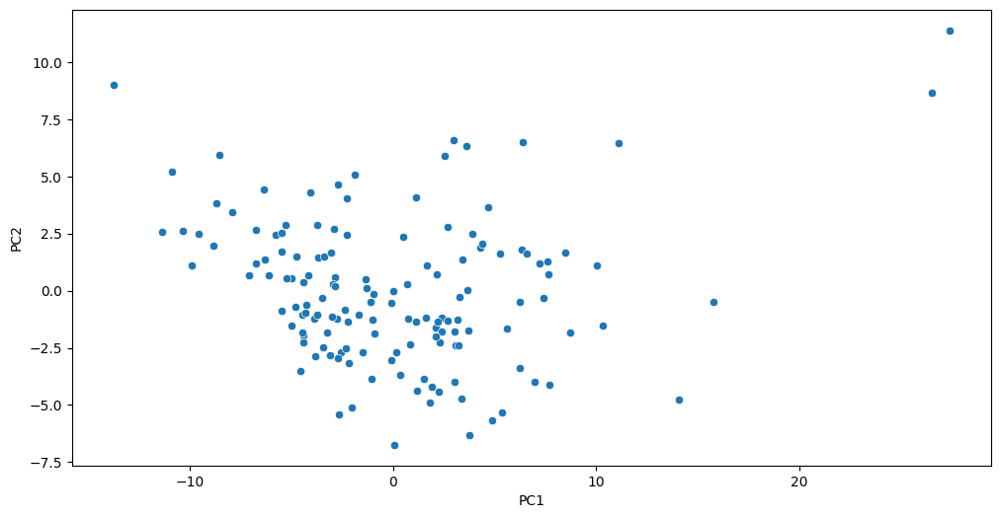

,PC1,PC2,Criterio
0,-5.027305,0.557782,Selectiva
1,0.736061,-1.235708,Sana
2,-7.110357,0.693910,Selectiva
3,6.955174,-4.009963,Selectiva
4,-1.712440,-1.037990,Selectiva
...,...,...,...
139,-8.863476,1.988112,Clínica
140,6.399193,6.510073,Clínica
141,-1.346342,0.483669,Clínica
142,-3.040857,1.644095,Clínica


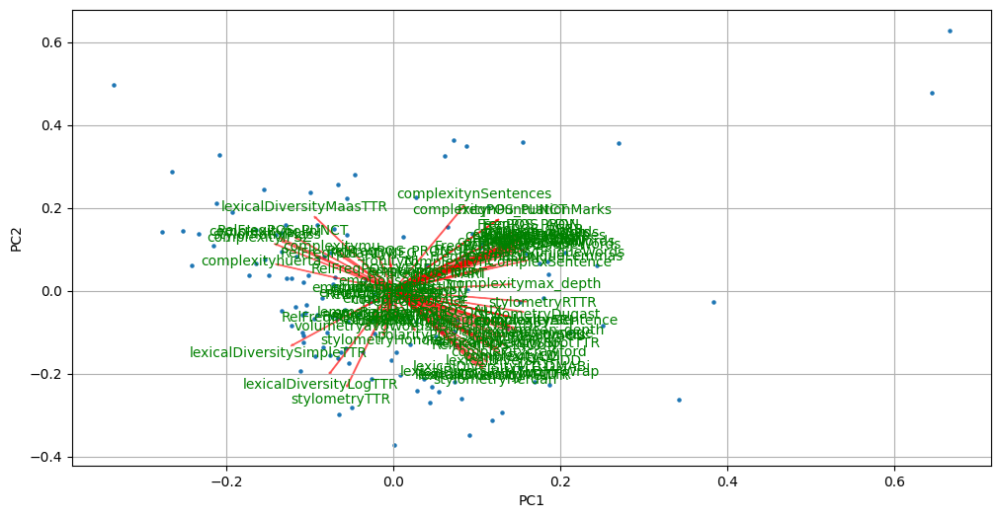

In [6]:
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
visualizer.show_pca(X,y)

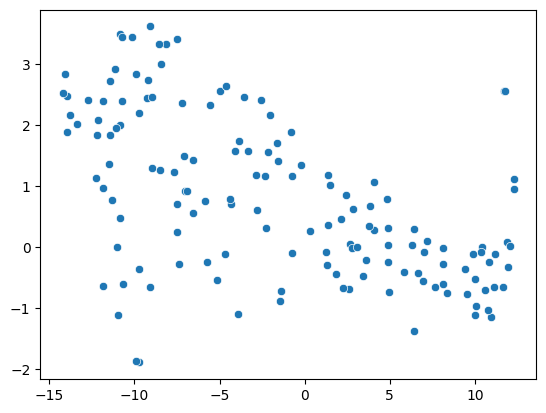

In [7]:
visualizer.show_tsne(X)

error is 0.43
error is 0.39
error is 0.33
error is 0.31
error is 0.30
error is 0.30
error is 0.30
error is 0.30
error is 0.30
error is 0.30


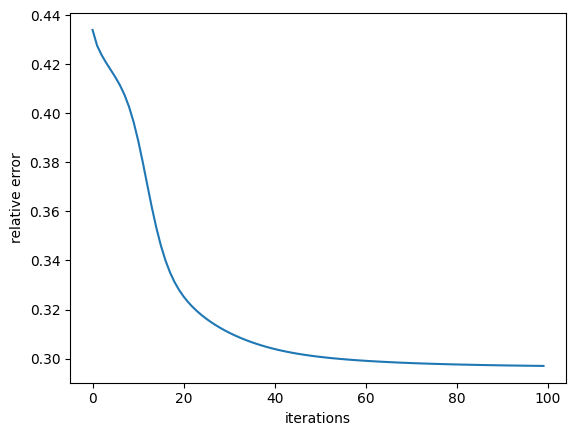

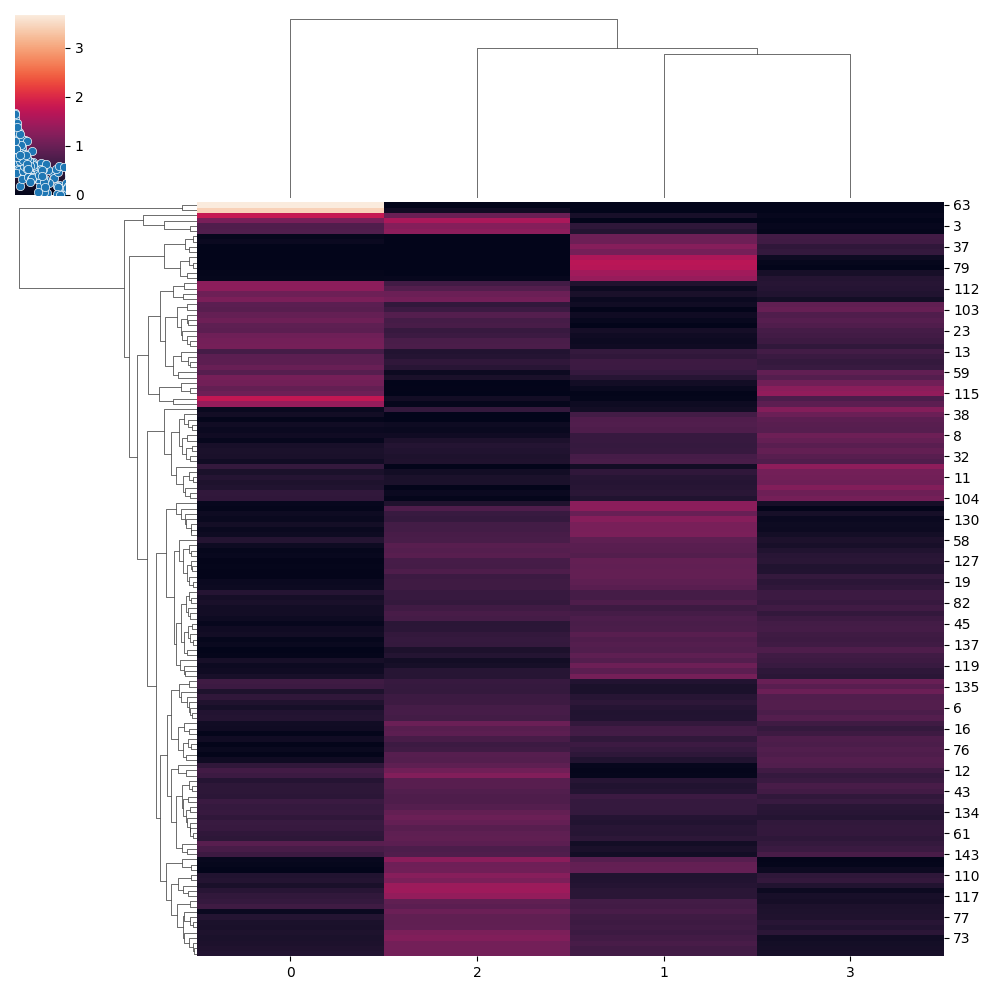

(array([[1.50139642e-01, 8.85664363e-01, 3.77821073e-01, 4.47655602e-01],
        [4.22012774e-01, 5.76146925e-01, 7.51770921e-01, 4.73441863e-01],
        [7.15160087e-02, 1.27811911e+00, 3.03200809e-01, 2.13427567e-01],
        [7.60372434e-01, 4.57093136e-01, 1.22036226e+00, 5.80598081e-02],
        [1.65062064e-01, 4.74635854e-01, 6.99533621e-01, 7.49618435e-01],
        [9.44225926e-02, 1.12088015e+00, 6.45238144e-01, 1.23511041e-01],
        [2.26926756e-01, 3.61145051e-01, 6.64463674e-01, 7.97802572e-01],
        [7.75828958e-01, 3.52669914e-01, 1.29824000e+00, 3.97496957e-02],
        [1.57180159e-01, 5.37579824e-01, 1.43330314e-01, 1.02275313e+00],
        [3.12480224e-01, 6.31212352e-01, 1.08220679e+00, 2.11330337e-01],
        [3.60160907e-01, 6.66456643e-01, 5.41941671e-01, 5.76790879e-01],
        [3.58612137e-01, 3.86091687e-01, 2.59977581e-01, 1.06984515e+00],
        [6.30096173e-01, 3.84199357e-02, 1.04660361e+00, 6.20012085e-01],
        [6.63592106e-01, 5.10390343e-0

In [8]:
visualizer.show_nnmf(4,X)

In [ ]:
X

In [ ]:
# Remove Features with low variance
print('------- Remove Features with low variance -------')
inference.removeLowVarianceEntities(X)

# Univariate feature selection
print('------- Univariate feature selection -------')
inference.univariateFeatureSelection(X,y, k=10)

# Feature selection using SelectFromModel
print('------- Feature selection using SelectFromModel -------')
inference.featureSelectionSelectFromModel(X,y)

print('------- Sequencial Feature Selection -------')
# Sequencial Feature Selection
label2id = {k: i for i, k in enumerate(['Selectiva', 'Sana', 'Indicada', 'Clínica'])}
yAux= df['Criterio'].apply(lambda x: label2id[x]).to_numpy()
inference.sequentialFeatureSelection(X,yAux,2)

## Inferencial Analysis

### Multiclass classification

In [ ]:
df['Edad']=df['Edad'].astype(str)

In [ ]:
dic_categorias = {
    'Criterio': ['Selectiva', 'Sana', 'Indicada', 'Clínica'],
    'Sexo': ['Chico', 'Chica'],
    'Edad': ["13", "16", "14", "15", "17", "12", "18"]
}

label2id = {k: i for i, k in enumerate(dic_categorias['Criterio'])}
id2label = list(dic_categorias['Criterio'])
print(label2id, id2label)


# Diferenciamos características por edades
data = []
cols = ['id_PRECOM']
ext_numeric_cols = []
for edad in dic_categorias['Edad']:
    for feat in numeric_cols:
      colname = f'{edad}_{feat}'
      ext_numeric_cols.append(colname)
cols += ['Criterio', 'Sexo'] + ext_numeric_cols
for id in df['id_PRECOM'].unique():
  sample = df[df['id_PRECOM'] == id]
  row = [id, sample['Criterio'].unique()[0], sample['Sexo'].unique()[0]]
  df1 =  df[df['id_PRECOM'] == id]
  for edad in dic_categorias['Edad']:
      df2 =  df1[df1['Edad'] == edad]
      for feat in numeric_cols:
        try:
          val = df2[feat].iloc[0]
        except:
          val = 0
        row.append(val)
  data.append(row)
ext_df = pd.DataFrame(data, columns=cols)

In [ ]:
print('------- With Generated Features -------')
#With Generated Features
print(inference.classificationWithFeatures(ext_df, ext_numeric_cols, 'Criterio', label2id, 'Sexo'))
print('------- With BoW -------')
#With BoW
tdf = df[['id_PRECOM', 'Criterio', 'Sexo', 'text']]
tdf['text'] = tdf.groupby(['id_PRECOM'])['text'].transform(lambda x: (' '.join(x)).lower())
tdf = tdf.drop_duplicates(ignore_index=True)
print(inference.classificationBoW(tdf, 'Criterio', label2id, 'Sexo'))
print('------- With Deep Vectors -------')
#With Deep Vectors
ddf = tdf.copy()
ddf['encoding'] = ddf.apply(lambda x: inference.gen_encodings(x['text']), axis=1)
print(inference.classificationDeepVectors(ddf, label2id, 'Criterio', 'text', 'Sexo'))

### Binary Classification 

In [ ]:
label2id = {'Sana': 0, 'Selectiva': 0, 'Clínica': 1, 'Indicada': 1}
id2label = ['Sana+Selectiva', 'Indicada+Clínica']

#With Feaures
print('------- With Generated Features -------')
print(inference.classificationWithFeatures(ext_df, ext_numeric_cols, 'Criterio', label2id, 'Sexo', False))
#BoW
print('------- With BoW -------')
tdf = df[['id_PRECOM', 'Criterio', 'Sexo', 'text']]
tdf['text'] = tdf.groupby(['id_PRECOM'])['text'].transform(lambda x: (' '.join(x)).lower())
tdf = tdf.drop_duplicates(ignore_index=True)
print(inference.classificationBoW(tdf, 'Criterio', label2id, 'Sexo'))
#Deep Vectors
print('------- With Deep Vectors -------')
ddf = tdf.copy()
ddf['encoding'] = ddf.apply(lambda x: inference.gen_encodings(x['text']), axis=1)
print(inference.classificationDeepVectors(ddf, label2id, 'Criterio', 'text', 'Sexo',True))
#Combining all Features

print('------- Combining all Features -------')
sdf = ext_df.dropna()
stdf = tdf.dropna()
sddf = ddf.dropna()
all_df = pd.merge(pd.merge(sdf, stdf), sddf)
print('  ----- For boys -----')
print(inference.combine_all_features(label2id, all_df, ext_numeric_cols, 'Sexo', 'Chico', 'text', 'Criterio'))
print('  ----- For girls -----')
print(inference.combine_all_features(label2id, all_df, ext_numeric_cols, 'Sexo', 'Chica', 'text', 'Criterio'))